In [7]:
# 1. Install Dependencies
!pip install segmentation-models-pytorch

import os
import sys
import torch
import importlib
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from torch.utils.data import DataLoader

# 2. Environment Setup
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"✅ Environment initialized on: {device}")

# 3. Clean Clone Repository
REPO_URL = "https://github.com/Kaankocc/autovision-cityscapes.git"
REPO_NAME = "autovision-cityscapes"

if os.path.exists(REPO_NAME):
    !rm -rf {REPO_NAME}
    
print("🚀 Cloning fresh repository...")
!git clone {REPO_URL}

# 4. Path Configurations
PROJECT_ROOT = os.path.abspath(REPO_NAME)
SRC_PATH = os.path.join(PROJECT_ROOT, "src")

if SRC_PATH not in sys.path:
    sys.path.insert(0, SRC_PATH)

# Force Python to refresh its module cache
importlib.invalidate_caches()

# 5. Fresh Imports
from dataset import CityscapesKaggleDataset
from models.deeplab_v3 import build_deeplabv3_plus

# 6. Data & Model Paths
RAW_DATA = "/kaggle/input/datasets/dansbecker/cityscapes-image-pairs/cityscapes_data"
# Change this to your exact Kaggle Input path for the fine-tuned weights!
MODEL_PATH = "/kaggle/input/models/kaankoc0/deeplabv3-resnet50-best-pth/pytorch/default/1/DeepLabV3 ResNet50 Best.pth" 

# 7. Load Validation Dataset
val_ds = CityscapesKaggleDataset(root_dir=RAW_DATA, split='val', target_size=(512, 512))
print(f"📁 Loaded {len(val_ds)} validation samples.")

# 8. Initialize DeepLabV3+ and Load Weights
model = build_deeplabv3_plus(n_classes=7).to(device)

if os.path.exists(MODEL_PATH):
    # Load weights safely
    model.load_state_dict(torch.load(MODEL_PATH, map_location=device, weights_only=True))
    model.eval()
    print("💎 Phase 2 DeepLabV3+ Weights Loaded Successfully.")
else:
    print(f"❌ ERROR: Could not find model file at {MODEL_PATH}")
    
CATEGORIES = ["Background", "Road", "Human", "Vehicle", "Construction", "Object", "Nature"]

✅ Environment initialized on: cpu
🚀 Cloning fresh repository...
Cloning into 'autovision-cityscapes'...
remote: Enumerating objects: 46, done.
remote: Counting objects: 100% (46/46), done.
remote: Compressing objects: 100% (34/34), done.
remote: Total 46 (delta 13), reused 41 (delta 9), pack-reused 0 (from 0)
Receiving objects: 100% (46/46), 23.74 MiB | 24.73 MiB/s, done.
Resolving deltas: 100% (13/13), done.
📁 Loaded 500 validation samples.


config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

💎 Phase 2 DeepLabV3+ Weights Loaded Successfully.


In [8]:
def run_performance_report(subset_size=100):
    print(f"📊 Analyzing {subset_size} validation samples for Phase 2...")
    ious = {cat: [] for cat in CATEGORIES}
    
    # Ensure we don't request more samples than exist in the val set
    subset_size = min(subset_size, len(val_ds))
    indices = np.random.choice(len(val_ds), subset_size, replace=False)
    
    for i in tqdm(indices):
        img, mask = val_ds[i]
        input_tensor = img.unsqueeze(0).to(device)
        
        with torch.no_grad():
            output = model(input_tensor)
            pred = torch.argmax(output.squeeze(), dim=0).cpu().numpy()
            
        for idx, cat in enumerate(CATEGORIES):
            # Convert mask to numpy safely
            true_mask = (mask == idx).numpy() if torch.is_tensor(mask) else (mask == idx)
            pred_mask = (pred == idx)
            
            intersection = (true_mask & pred_mask).sum()
            union = (true_mask | pred_mask).sum()
            
            if union > 0:
                ious[cat].append(intersection / union)

    # Print Report
    print("\n" + "🚀" + " PHASE 2 (DeepLabV3+) MIOU REPORT ".center(40, "-") + "🚀")
    print(f"{'Category':<15} | {'IoU Score':<10}")
    print("-" * 42)
    
    all_scores = []
    for cat in CATEGORIES:
        score = np.mean(ious[cat]) * 100 if ious[cat] else 0
        all_scores.append(score)
        print(f"{cat:<15} : {score:.2f}%")
    
    print("-" * 42)
    print(f"{'MEAN IoU':<15} : {np.mean(all_scores):.2f}%")
    print("=" * 42)

run_performance_report()

📊 Analyzing 100 validation samples for Phase 2...


100%|██████████| 100/100 [01:28<00:00,  1.13it/s]


🚀--- PHASE 2 (DeepLabV3+) MIOU REPORT ---🚀
Category        | IoU Score 
------------------------------------------
Background      : 65.44%
Road            : 90.50%
Human           : 25.85%
Vehicle         : 72.76%
Construction    : 69.52%
Object          : 16.70%
Nature          : 71.25%
------------------------------------------
MEAN IoU        : 58.86%


🕵️ Hunting for complex urban scenes...


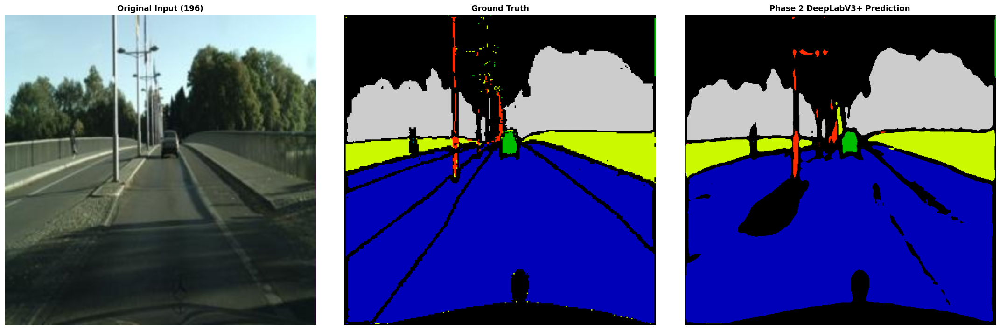

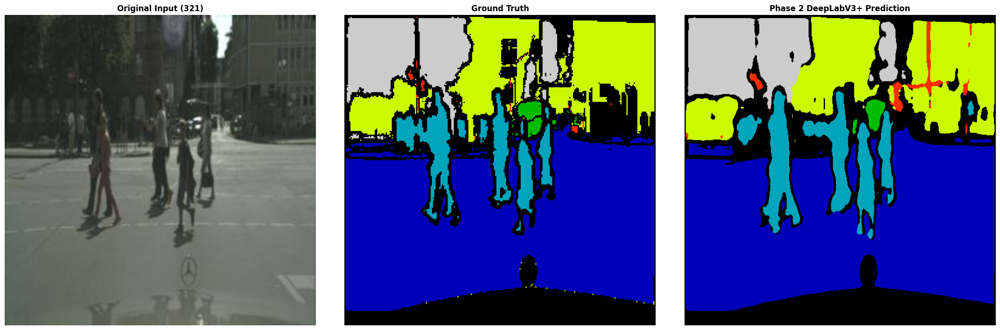

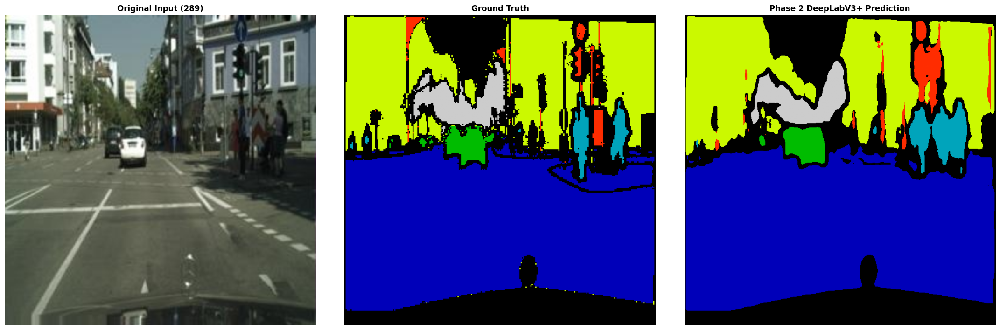

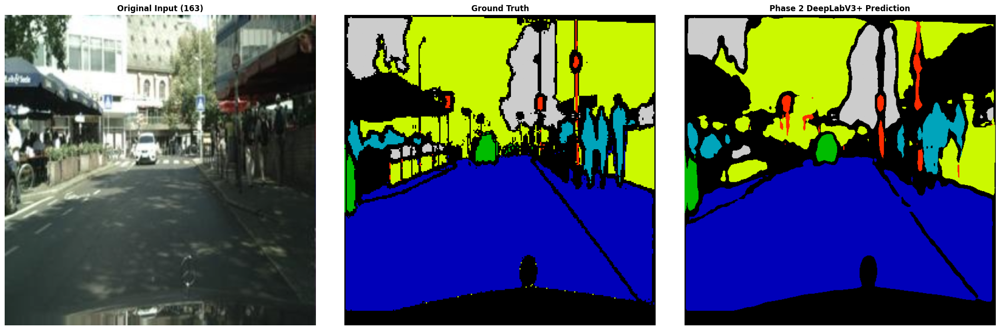

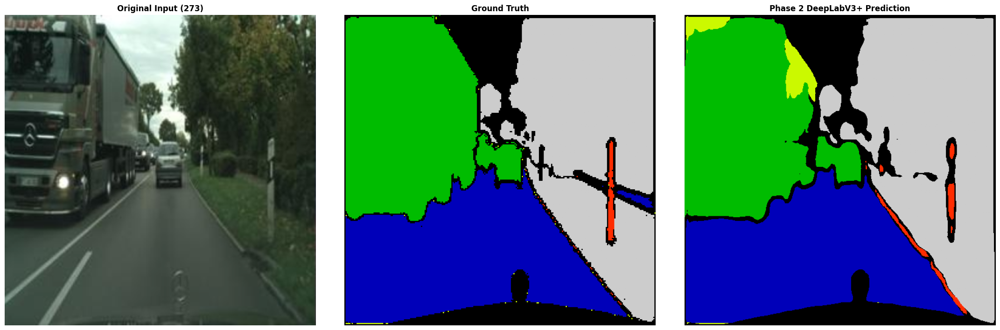

In [9]:
def denormalize(tensor):
    """Reverses ImageNet normalization for visualization."""
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    return tensor * std + mean

def visualize_results(num_samples=3):
    count = 0
    attempts = 0
    
    print("🕵️ Hunting for complex urban scenes...")
    
    while count < num_samples and attempts < 100:
        attempts += 1
        idx = np.random.randint(0, len(val_ds))
        img, mask = val_ds[idx]
        
        # Focus on scenes with Humans (2) or specific Objects (5)
        # Convert mask to numpy for checking conditions
        np_mask = mask.numpy() if torch.is_tensor(mask) else mask
        
        if (np_mask == 2).sum() > 300 or (np_mask == 5).sum() > 300:
            count += 1
            with torch.no_grad():
                input_t = img.unsqueeze(0).to(device)
                output = model(input_t)
                pred = torch.argmax(output.squeeze(), dim=0).cpu().numpy()
            
            # Rendering
            fig, ax = plt.subplots(1, 3, figsize=(22, 7))
            
            # 1. Denormalize the input image for human viewing
            vis_img = denormalize(img).clamp(0, 1)
            ax[0].imshow(vis_img.permute(1, 2, 0).numpy())
            ax[0].set_title(f"Original Input ({idx})", fontweight='bold')
            ax[0].axis('off')
            
            # 2. Ground Truth
            ax[1].imshow(np_mask, cmap='nipy_spectral', vmin=0, vmax=6)
            ax[1].set_title("Ground Truth", fontweight='bold')
            ax[1].axis('off')
            
            # 3. Prediction
            ax[2].imshow(pred, cmap='nipy_spectral', vmin=0, vmax=6)
            ax[2].set_title("Phase 2 DeepLabV3+ Prediction", fontweight='bold')
            ax[2].axis('off')
            
            plt.tight_layout()
            plt.show()

visualize_results(num_samples=5)

🎨 Generating Professional Blended Overlays...


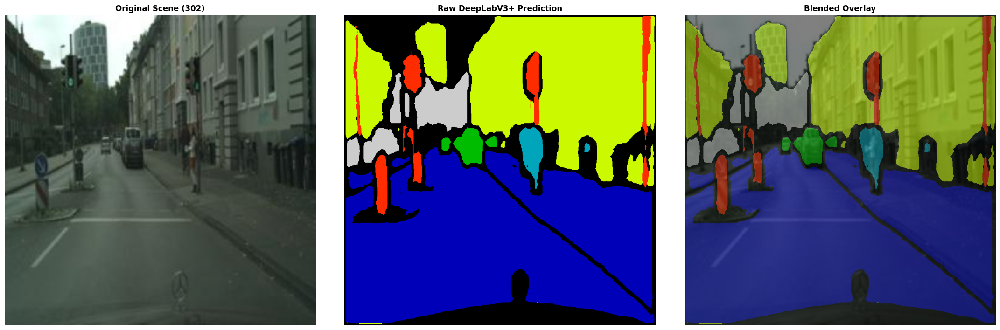

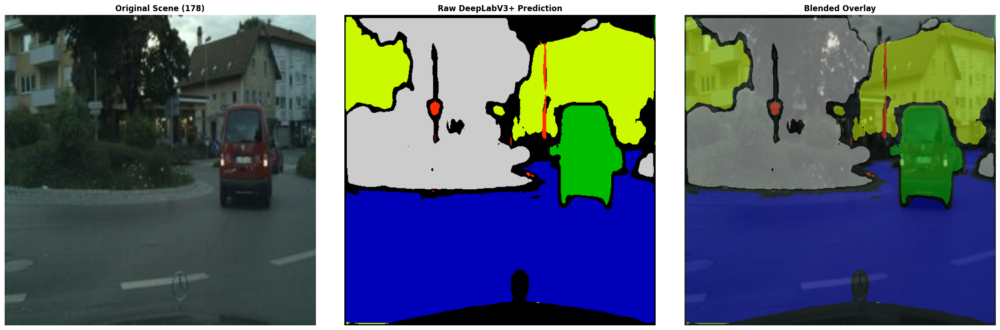

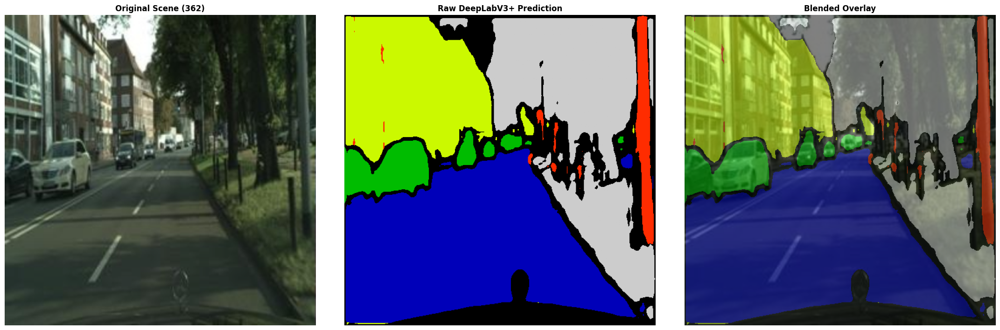

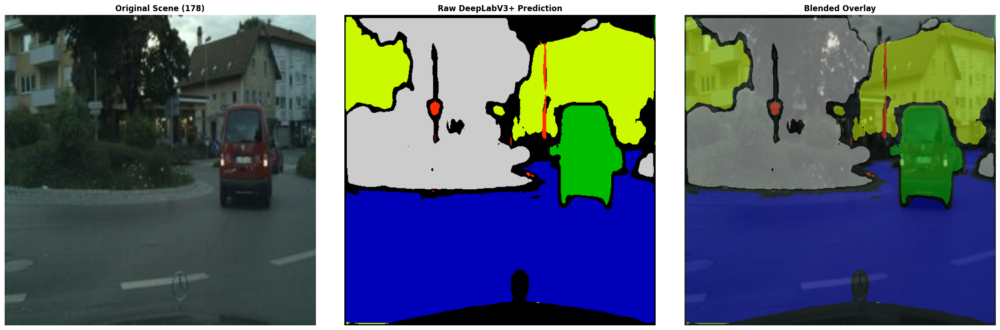

In [10]:
def visualize_blended_results(num_samples=3):
    count = 0
    print("🎨 Generating Professional Blended Overlays...")
    
    while count < num_samples:
        idx = np.random.randint(0, len(val_ds))
        img, mask = val_ds[idx]
        
        with torch.no_grad():
            input_t = img.unsqueeze(0).to(device)
            output = model(input_t)
            pred = torch.argmax(output.squeeze(), dim=0).cpu().numpy()
        
        # Prepare Images
        vis_img = denormalize(img).clamp(0, 1).permute(1, 2, 0).numpy()
        
        # Setup Plot
        fig, ax = plt.subplots(1, 3, figsize=(22, 7))
        
        # 1. Original Image
        ax[0].imshow(vis_img)
        ax[0].set_title(f"Original Scene ({idx})", fontweight='bold')
        ax[0].axis('off')
        
        # 2. Predicted Mask
        ax[1].imshow(pred, cmap='nipy_spectral', vmin=0, vmax=6)
        ax[1].set_title("Raw DeepLabV3+ Prediction", fontweight='bold')
        ax[1].axis('off')
        
        # 3. Alpha Blended Overlay
        ax[2].imshow(vis_img)
        # alpha=0.5 makes the mask 50% transparent
        ax[2].imshow(pred, cmap='nipy_spectral', vmin=0, vmax=6, alpha=0.5) 
        ax[2].set_title("Blended Overlay", fontweight='bold')
        ax[2].axis('off')
        
        plt.tight_layout()
        plt.show()
        count += 1

visualize_blended_results(num_samples=4)

🔍 Analyzing Model Confidence (Uncertainty Mapping)...


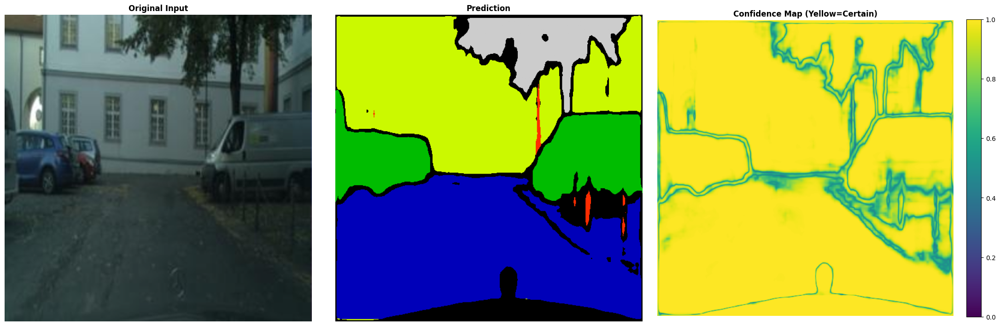

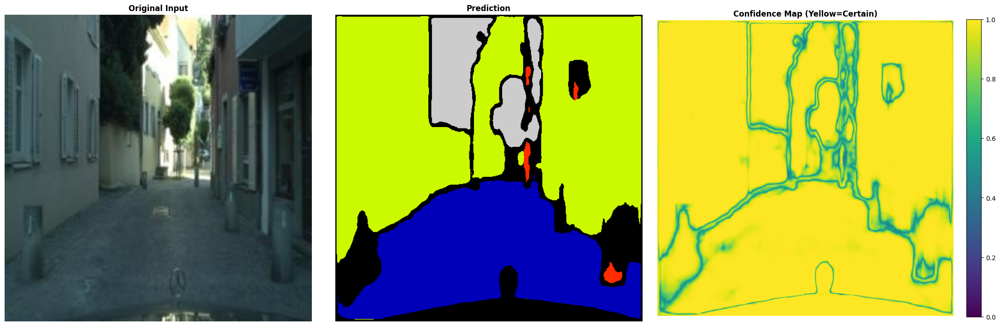

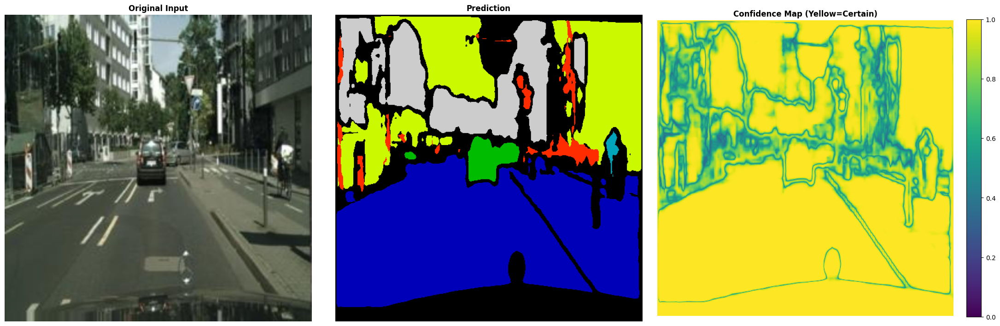

In [11]:
import torch.nn.functional as F

def visualize_confidence(num_samples=3):
    count = 0
    print("🔍 Analyzing Model Confidence (Uncertainty Mapping)...")
    
    while count < num_samples:
        idx = np.random.randint(0, len(val_ds))
        img, mask = val_ds[idx]
        
        with torch.no_grad():
            input_t = img.unsqueeze(0).to(device)
            logits = model(input_t)
            
            # Convert raw logits to probabilities (0.0 to 1.0)
            probs = F.softmax(logits.squeeze(), dim=0)
            
            # Get the confidence score of the chosen class
            confidence = torch.max(probs, dim=0)[0].cpu().numpy()
            pred = torch.argmax(probs, dim=0).cpu().numpy()
            
        vis_img = denormalize(img).clamp(0, 1).permute(1, 2, 0).numpy()
        
        fig, ax = plt.subplots(1, 3, figsize=(22, 7))
        
        # 1. Original Input
        ax[0].imshow(vis_img)
        ax[0].set_title("Original Input", fontweight='bold')
        ax[0].axis('off')
        
        # 2. Prediction
        ax[1].imshow(pred, cmap='nipy_spectral', vmin=0, vmax=6)
        ax[1].set_title("Prediction", fontweight='bold')
        ax[1].axis('off')
        
        # 3. Confidence Map (Viridis: Yellow = 100% Certain, Purple = Uncertain)
        conf_plot = ax[2].imshow(confidence, cmap='viridis', vmin=0, vmax=1)
        ax[2].set_title("Confidence Map (Yellow=Certain)", fontweight='bold')
        ax[2].axis('off')
        
        # Add a colorbar to the confidence map
        plt.colorbar(conf_plot, ax=ax[2], fraction=0.046, pad=0.04)
        
        plt.tight_layout()
        plt.show()
        count += 1

visualize_confidence(num_samples=3)

📸 Generating 4 high-res images to ./readme_images/ ...
✅ Saved: readme_images/segmentation_showcase_1.png


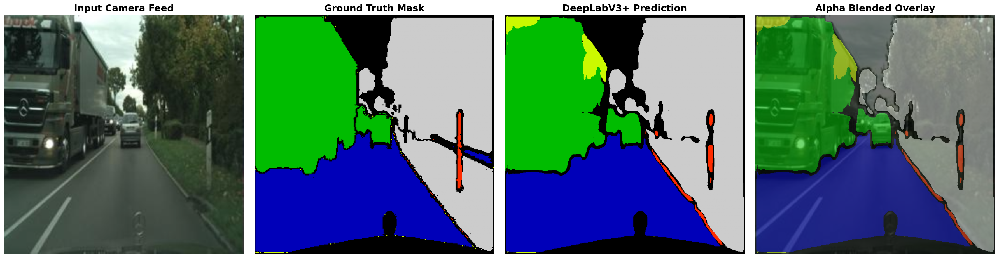

✅ Saved: readme_images/segmentation_showcase_2.png


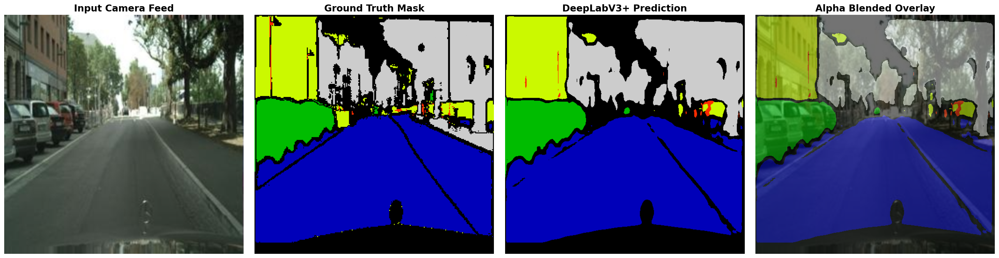

✅ Saved: readme_images/segmentation_showcase_3.png


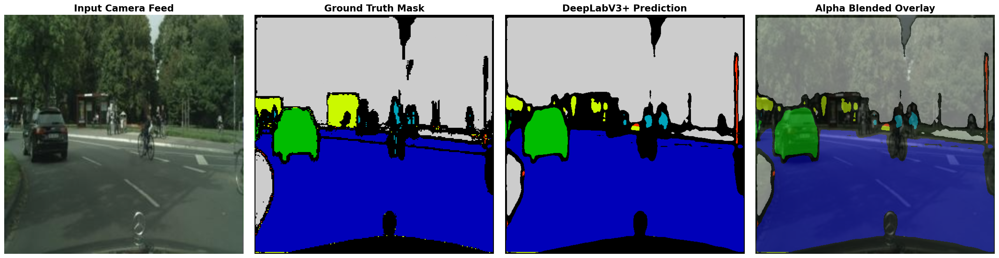

✅ Saved: readme_images/segmentation_showcase_4.png


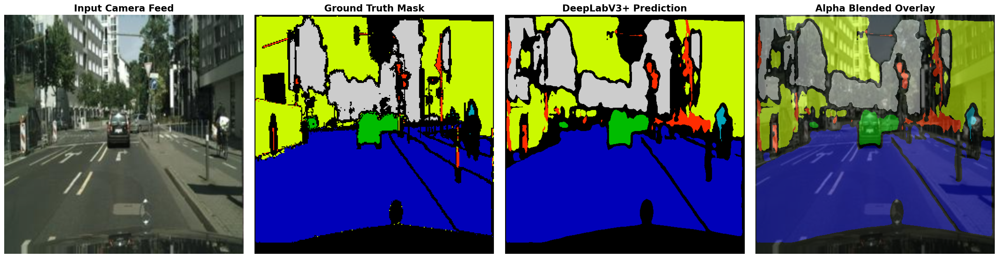

In [12]:
import os

def generate_readme_images(num_samples=4, save_dir="readme_images"):
    # 1. Create a folder to hold the images
    os.makedirs(save_dir, exist_ok=True)
    print(f"📸 Generating {num_samples} high-res images to ./{save_dir}/ ...")
    
    count = 0
    attempts = 0
    
    while count < num_samples and attempts < 100:
        attempts += 1
        idx = np.random.randint(0, len(val_ds))
        img, mask = val_ds[idx]
        
        # Focus on interesting scenes with Vehicles (3) or Humans (2)
        np_mask = mask.numpy() if torch.is_tensor(mask) else mask
        if (np_mask == 2).sum() > 200 or (np_mask == 3).sum() > 500:
            with torch.no_grad():
                input_t = img.unsqueeze(0).to(device)
                output = model(input_t)
                pred = torch.argmax(output.squeeze(), dim=0).cpu().numpy()
            
            vis_img = denormalize(img).clamp(0, 1).permute(1, 2, 0).numpy()
            
            # 2. Setup a wide, high-resolution plot (150 DPI)
            fig, ax = plt.subplots(1, 4, figsize=(24, 6), dpi=150)
            
            ax[0].imshow(vis_img)
            ax[0].set_title("Input Camera Feed", fontsize=16, fontweight='bold')
            ax[0].axis('off')
            
            ax[1].imshow(np_mask, cmap='nipy_spectral', vmin=0, vmax=6)
            ax[1].set_title("Ground Truth Mask", fontsize=16, fontweight='bold')
            ax[1].axis('off')
            
            ax[2].imshow(pred, cmap='nipy_spectral', vmin=0, vmax=6)
            ax[2].set_title("DeepLabV3+ Prediction", fontsize=16, fontweight='bold')
            ax[2].axis('off')
            
            ax[3].imshow(vis_img)
            ax[3].imshow(pred, cmap='nipy_spectral', vmin=0, vmax=6, alpha=0.55)
            ax[3].set_title("Alpha Blended Overlay", fontsize=16, fontweight='bold')
            ax[3].axis('off')
            
            plt.tight_layout()
            
            # 3. Save the figure to the hard drive
            filename = os.path.join(save_dir, f"segmentation_showcase_{count+1}.png")
            plt.savefig(filename, bbox_inches='tight', facecolor='white')
            print(f"✅ Saved: {filename}")
            
            # 4. Display in notebook
            plt.show()
            
            count += 1

# Run the generator
generate_readme_images(num_samples=4)